In [50]:
%load_ext lab_black

The lab_black extension is already loaded. To reload it, use:
  %reload_ext lab_black


In [51]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [52]:
import os
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from pysal.model import mgwr
from scipy.stats import pearsonr
from sklearn.preprocessing import PowerTransformer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, KNNImputer
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

from urbana.models.plot_predictions import PredictedAccuracy
from urbana.constants import DIR_REPO, DIR_DATA

In [53]:
# papermill parameters cell
# https://papermill.readthedocs.io/en/latest/usage-parameterize.html

YEAR = 2017
MONTH = 7

OUTPUT_WARNINGS = False
SAVE_FIGS = False
FIT_INTERCEPT = True

VARIABLE_TO_PREDICT = "Airbnb_Number"

In [54]:
if OUTPUT_WARNINGS is False:
    import warnings

    warnings.filterwarnings("ignore")

# Parameter Check

In [55]:
ALLOWED_YEARS = [2017, 2018]

if YEAR not in ALLOWED_YEARS:
    raise Exception("Please select a year within: {}".format(ALLOWED_YEARS))

if YEAR == 2018 and MONTH == 3:
    raise Exception(
        "Month 3 (March) is not available for 2018. Please choose a different month."
    )

In [56]:
# Create folders to store the data
DIR_VAR = DIR_DATA / "processed/{}".format(VARIABLE_TO_PREDICT)
DIR_MONTH = DIR_VAR / "{}_{:02d}".format(YEAR, MONTH)
DIR_GWR = DIR_MONTH / "02_gwr"

if SAVE_FIGS:
    folder_list = [
        DIR_GWR,
        DIR_GWR / "coefficients",
    ]

    for folder in folder_list:
        if not os.path.exists(folder):
            os.makedirs(folder)

In [57]:
PATH_TO_FILE = DIR_DATA / "interim/sections_{}_{:02d}.csv".format(YEAR, MONTH)
if os.path.isfile(PATH_TO_FILE) is False:
    raise Exception(
        'Please run first the notebook "00acquisition.ipynb" with the same date and "SAVE_DATA" set to True'
    )

In [58]:
PATH_TO_FILE = DIR_MONTH / "01_linear/coefficients.csv"
if os.path.isfile(PATH_TO_FILE) is False:
    raise Exception(
        'Please run first the notebook "01linear.ipynb" with the same date and "SAVE_MODEL" set to True'
    )

# Initial visualizations

In [59]:
sect = pd.read_csv(
    DIR_DATA / "interim/sections_{}_{:02d}.csv".format(YEAR, MONTH),
)

sect.set_index("Tag", inplace=True)

sect.drop(
    ["N_district", "N_neighbourhood", "N_section"],
    axis=1,
    inplace=True,
)
sect.drop(["Percentage_Age_25_39"], axis=1, inplace=True)  # Duplicate


sect.isnull().sum(axis=0).sort_values(ascending=False).head(10)

Airbnb_Location_Score     89
Airbnb_Price              55
Airbnb_Price_Person       55
Rent_Area_Flats           19
Rent_Price_Total_Flats    19
Rent_Price_Meter_Flats    19
Rent_Number_Flats         10
Nationality_USA            0
Nationality_Argentina      0
Nationality_Venezuela      0
dtype: int64

In [60]:
geo_info = gpd.read_file(
    DIR_DATA / "interim/sections_geo.json",
)

geo_info.set_index("Tag", inplace=True)

geo_coefs = geo_info.copy()
geo_tvals = geo_info.copy()
geo_nans = geo_info.copy()

In [61]:
y = np.array(sect[VARIABLE_TO_PREDICT]).reshape((-1, 1))
X = sect.drop(
    [
        "Airbnb_Number",
        "Airbnb_Price",
        "Airbnb_Price_Person",
        "Airbnb_Location_Score",
    ],
    axis=1,
)
coords = np.column_stack(
    [geo_info["geometry"].centroid.x, geo_info["geometry"].centroid.y]
)

geo_info["centroid"] = geo_info["geometry"].centroid

In [62]:
geo_info[VARIABLE_TO_PREDICT] = sect[VARIABLE_TO_PREDICT]

id_max_airbnb = geo_info[VARIABLE_TO_PREDICT].idxmax()

print("Area with maximum value: " + str(id_max_airbnb))

Area with maximum value: 02_077


## Target variable

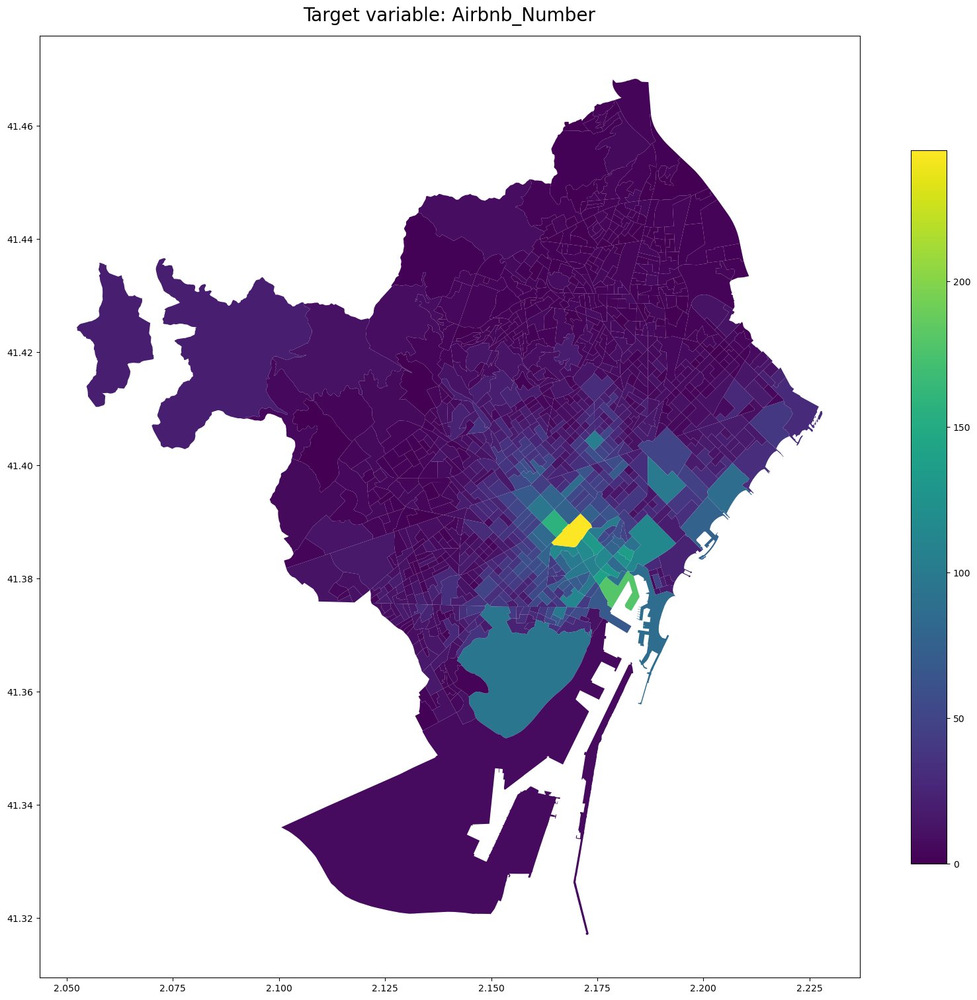

In [63]:
fig, ax = plt.subplots(figsize=(20, 20))

geo_info.plot(
    ax=ax,
    column=VARIABLE_TO_PREDICT,
    legend=True,
    figsize=(20, 20),
    legend_kwds={"shrink": 0.7},
)

ax.set_title("Target variable: " + str(VARIABLE_TO_PREDICT), fontsize=20, y=1.01)

if SAVE_FIGS:
    plt.savefig(DIR_GWR / "target_variable.svg", format="svg")

plt.show()

## NaNs

In [64]:
# define the colormap
cmap = plt.cm.Accent_r
# extract all colors from the .jet map
cmaplist = [cmap(i) for i in range(cmap.N)]
# force the first color entry to be grey
# cmaplist[0] = (0.5, 0.5, 0.5, 1.0)
cmaplist[0] = "0.8"
# define the bins and normalize
bounds = np.linspace(0, 8, 9)
my_norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

my_cmap = mpl.colors.LinearSegmentedColormap.from_list("Custom cmap", cmaplist, cmap.N)

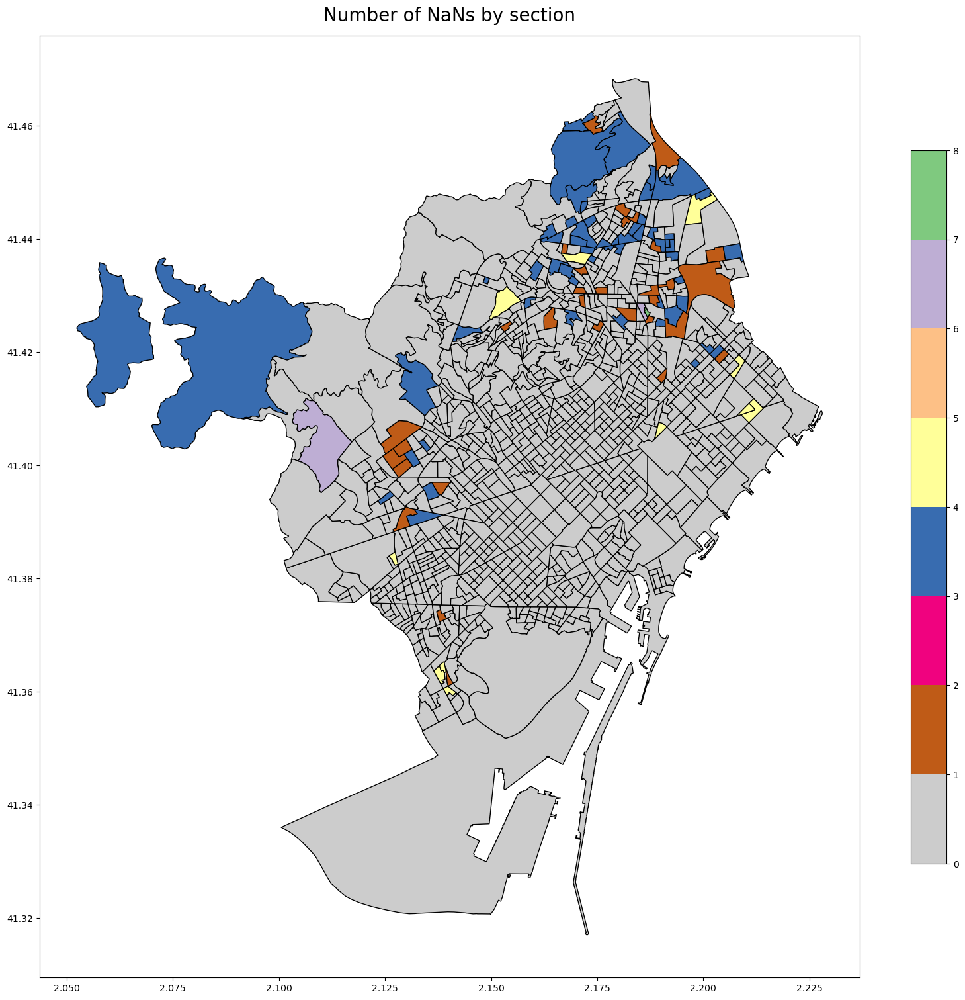

In [65]:
geo_nans["NaNs"] = pd.isnull(sect).sum(axis=1)

fig, ax = plt.subplots(figsize=(20, 20))

geo_nans.plot(
    ax=ax,
    column="NaNs",
    edgecolor="black",
    legend=True,
    norm=my_norm,
    cmap=my_cmap,
    figsize=(20, 20),
    legend_kwds={"shrink": 0.7},
)

ax.set_title("Number of NaNs by section", fontsize=20, y=1.01)

if SAVE_FIGS:
    plt.savefig(DIR_GWR / "nans.svg", format="svg")

plt.show()

# GWR

### Load best model (from notebook "01linear")

In [66]:
linear_coefs = pd.read_csv(DIR_MONTH / "01_linear/coefficients.csv", index_col=0)
best_model = linear_coefs.drop(["Intercept"], axis=1).columns

print(best_model)

Index(['Distance_Center', 'Nationality_UK', 'Nationality_Italy',
       'POI_Restaurants_Hotels', 'Education_University',
       'Percentage_Age_65_Plus', 'Rent_Number_Flats',
       'POI_Souvenirs_Thrift_Store'],
      dtype='object')


In [67]:
X_chosen = sect[best_model]
y_chosen = np.array(sect[VARIABLE_TO_PREDICT]).reshape((-1, 1))

Let's check if there are missing values for these features

In [68]:
pd.isnull(X_chosen).sum(0)

Distance_Center                0
Nationality_UK                 0
Nationality_Italy              0
POI_Restaurants_Hotels         0
Education_University           0
Percentage_Age_65_Plus         0
Rent_Number_Flats             10
POI_Souvenirs_Thrift_Store     0
dtype: int64

### Preprocessing

Since there are not missing values, we do not have to use a imputer.

We will transform the features so they follow a Gaussain-like distribution.

In [69]:
X_transformed = X_chosen.copy()

if pd.isnull(X_chosen).sum().sum() != 0:
    knn_X = KNNImputer()
    knn_X.fit(X_transformed)
    X_transformed = knn_X.transform(X_transformed)

pw_X = PowerTransformer()
pw_X.fit(X_transformed)
X_transformed = pw_X.transform(X_transformed)

pw_y = PowerTransformer()
pw_y.fit(y_chosen)
y_transformed = pw_y.transform(y_chosen)

### Check multicolinearity

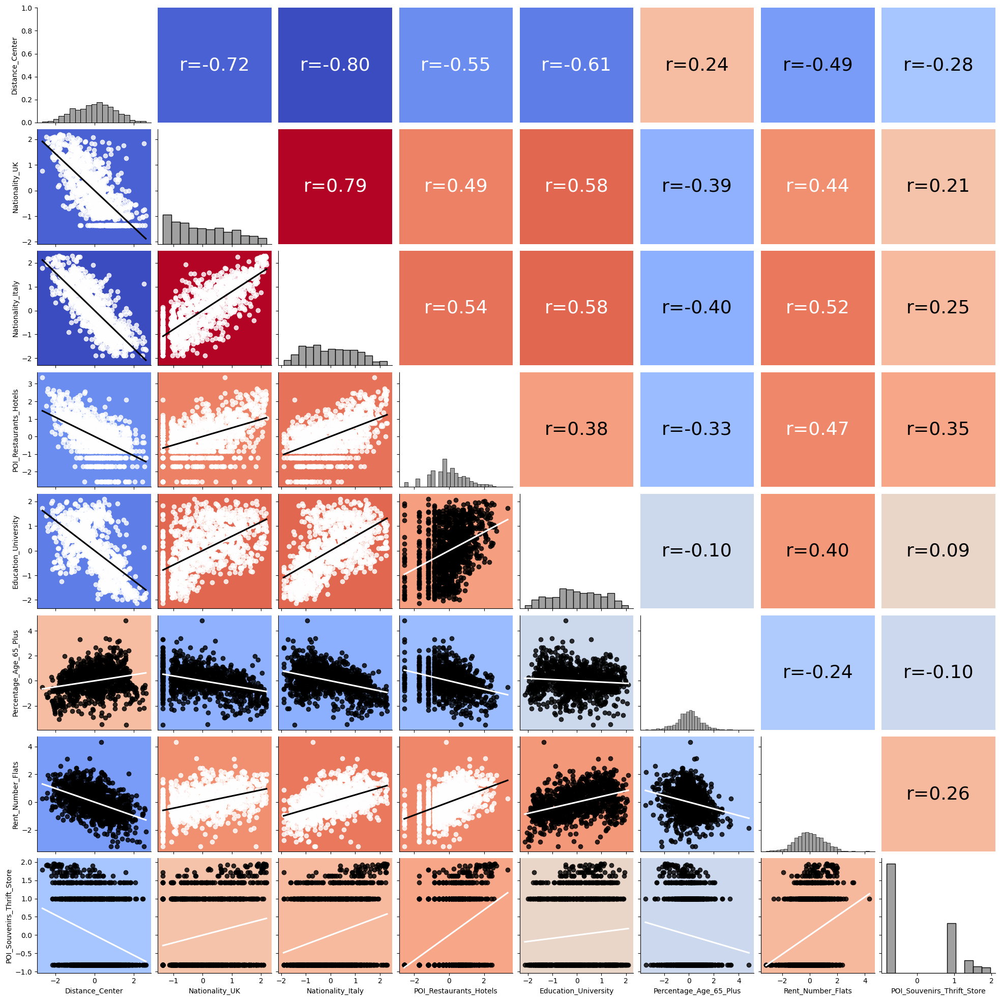

In [70]:
def corrfunc(x, y, **kwds):
    cmap = kwds["cmap"]
    norm = kwds["norm"]
    ax = plt.gca()
    ax.tick_params(bottom=False, top=False, left=False, right=False)
    sns.despine(ax=ax, bottom=True, top=True, left=True, right=True)
    r, _ = pearsonr(x, y)
    facecolor = cmap(norm(r))
    ax.set_facecolor(facecolor)
    lightness = (max(facecolor[:3]) + min(facecolor[:3])) / 2
    ax.annotate(
        f"r={r:.2f}",
        xy=(0.5, 0.5),
        xycoords=ax.transAxes,
        color="white" if lightness < 0.7 else "black",
        size=26,
        ha="center",
        va="center",
    )


def scattfunc(x, y, **kwds):
    cmap = kwds["cmap"]
    norm = kwds["norm"]
    ax = plt.gca()
    r, _ = pearsonr(x, y)
    facecolor = cmap(norm(r))
    lightness = (max(facecolor[:3]) + min(facecolor[:3])) / 2
    myColor = "white" if lightness < 0.7 else "black"
    lineColor = "black" if lightness < 0.7 else "white"
    ax.set_facecolor(facecolor)
    sns.regplot(x=x, y=y, ax=ax, color=myColor, line_kws={"color": lineColor}, ci=None)


g = sns.PairGrid(pd.DataFrame(X_transformed, columns=X_chosen.columns))
g.map_lower(
    scattfunc, cmap=plt.get_cmap("coolwarm"), norm=plt.Normalize(vmin=-0.8, vmax=0.8)
)
g.map_diag(sns.histplot, color="gray", kde=False)
g.map_upper(
    corrfunc, cmap=plt.get_cmap("coolwarm"), norm=plt.Normalize(vmin=-0.8, vmax=0.8)
)
g.fig.subplots_adjust(wspace=0.06, hspace=0.06)  # equal spacing in both directions


if SAVE_FIGS:
    plt.savefig(DIR_GWR / "correlations.svg", format="svg")

In [71]:
vif = pd.DataFrame()
vif["VIF"] = [
    variance_inflation_factor(X_transformed, i) for i in range(X_transformed.shape[1])
]
vif["variable"] = X_chosen.columns

vif

,VIF,variable
0,3.454021,Distance_Center
1,3.109405,Nationality_UK
2,4.230252,Nationality_Italy
3,1.717837,POI_Restaurants_Hotels
4,1.842094,Education_University
5,1.350061,Percentage_Age_65_Plus
6,1.522327,Rent_Number_Flats
7,1.186368,POI_Souvenirs_Thrift_Store


## Model training

### Bandwith selection

In [72]:
gwr_chosen_selector = mgwr.sel_bw.Sel_BW(
    coords, y_transformed, X_transformed, fixed=False, spherical=True, multi=False
)
gwr_bw = gwr_chosen_selector.search()
print("GWR with chosen and transformed features")
print("Bandwith (KNN): " + str(int(gwr_bw)))

GWR with chosen and transformed features
Bandwith (KNN): 205


### Fit the model

In [73]:
gwr_model = mgwr.gwr.GWR(
    coords, y_transformed, X_transformed, gwr_bw, constant=FIT_INTERCEPT
)
gwr_results = gwr_model.fit()
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                1068
Number of covariates:                                                     9

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                            269.164
Log-likelihood:                                                    -779.455
AIC:                                                               1576.910
AICc:                                                              1579.118
BIC:                                                              -7115.818
R2:                                                                   0.748
Adj. R2:                                                              0.746

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

## Model predictions

In [74]:
gwr_model.predict(coords, X_transformed)
y_predicted = gwr_results.predictions

### Transformed (Gaussian) data

In [75]:
y_predicted_transformed = y_predicted.copy()
y_predicted = pw_y.inverse_transform(y_predicted).round().flatten()
y_predicted = pd.Series(y_predicted, name="GWR")
y_truth = pd.Series(y.flatten(), name="True Data")
pa_gwr = PredictedAccuracy(y_truth, y_predicted)

In [76]:
# y_predicted.values
df_predictions = pd.DataFrame(
    y_predicted.values, index=geo_info.index, columns=["Predictions"]
)
df_predictions

,Predictions
Tag,
01_001,65.0
01_002,54.0
01_003,56.0
01_004,80.0
01_005,83.0
...,...
10_143,2.0
10_234,9.0
10_235,8.0


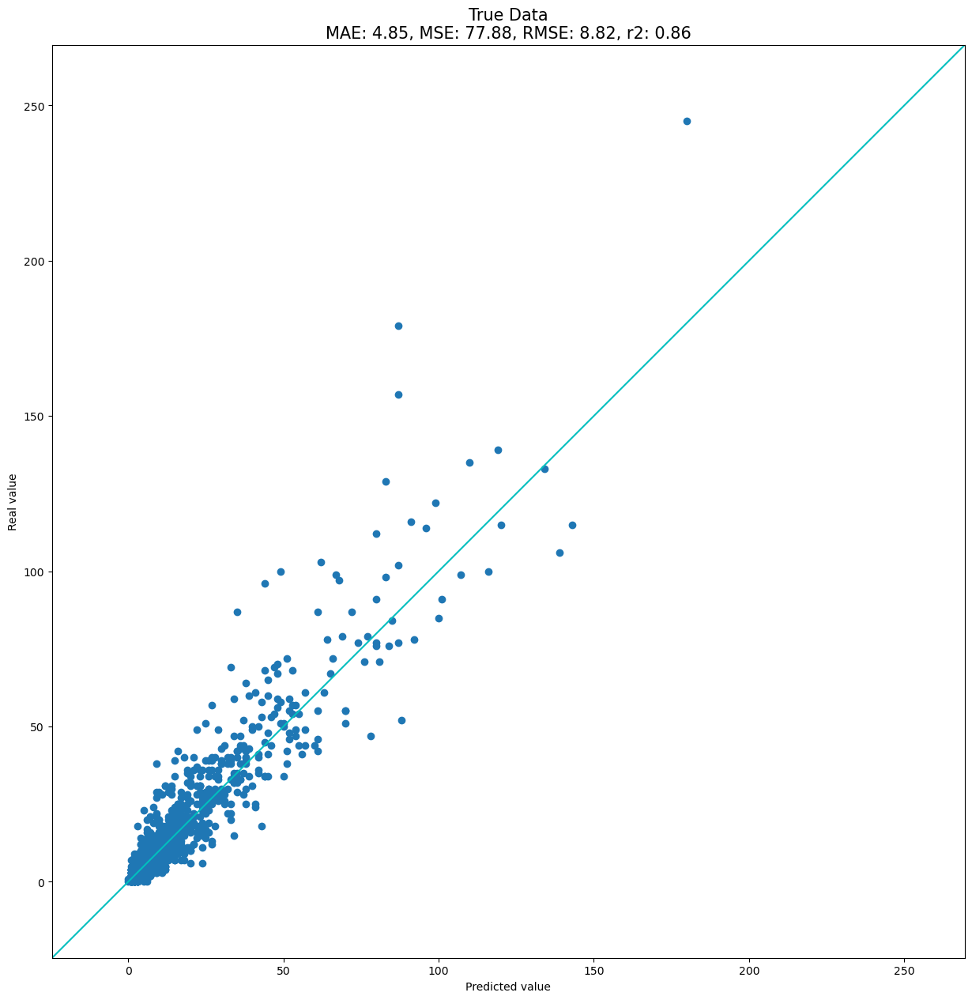

In [77]:
pa_gwr.plot_scatter(save_fig=SAVE_FIGS, root_name=DIR_GWR / "gwr_model")

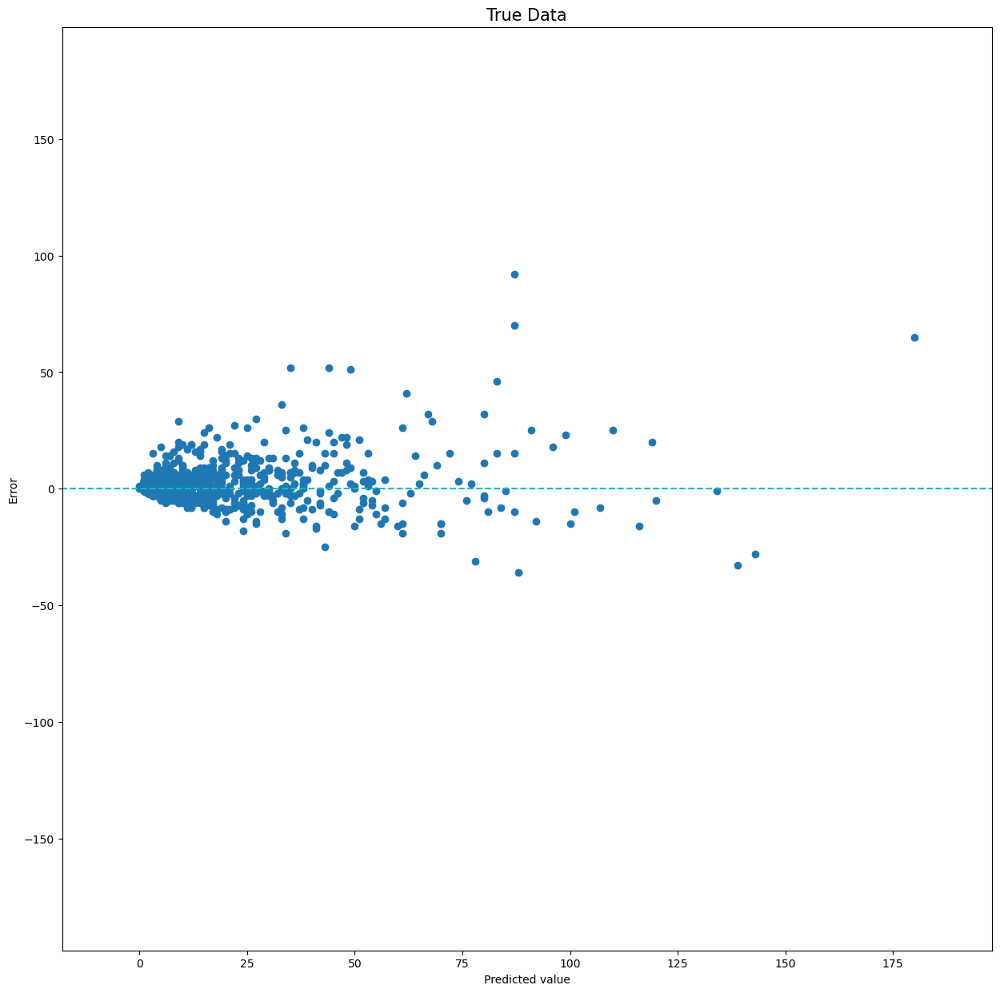

In [78]:
pa_gwr.plot_errors(save_fig=SAVE_FIGS, root_name=DIR_GWR / "gwr_model")

### Original data

In [79]:
y_predicted_transformed = pd.Series(
    y_predicted_transformed.flatten(), name="GWR_predicted_transformed"
)
y_transformed = pd.Series(y_transformed.flatten(), name="GWR_transformed")
pa_gwr_tf = PredictedAccuracy(y_transformed, y_predicted_transformed)

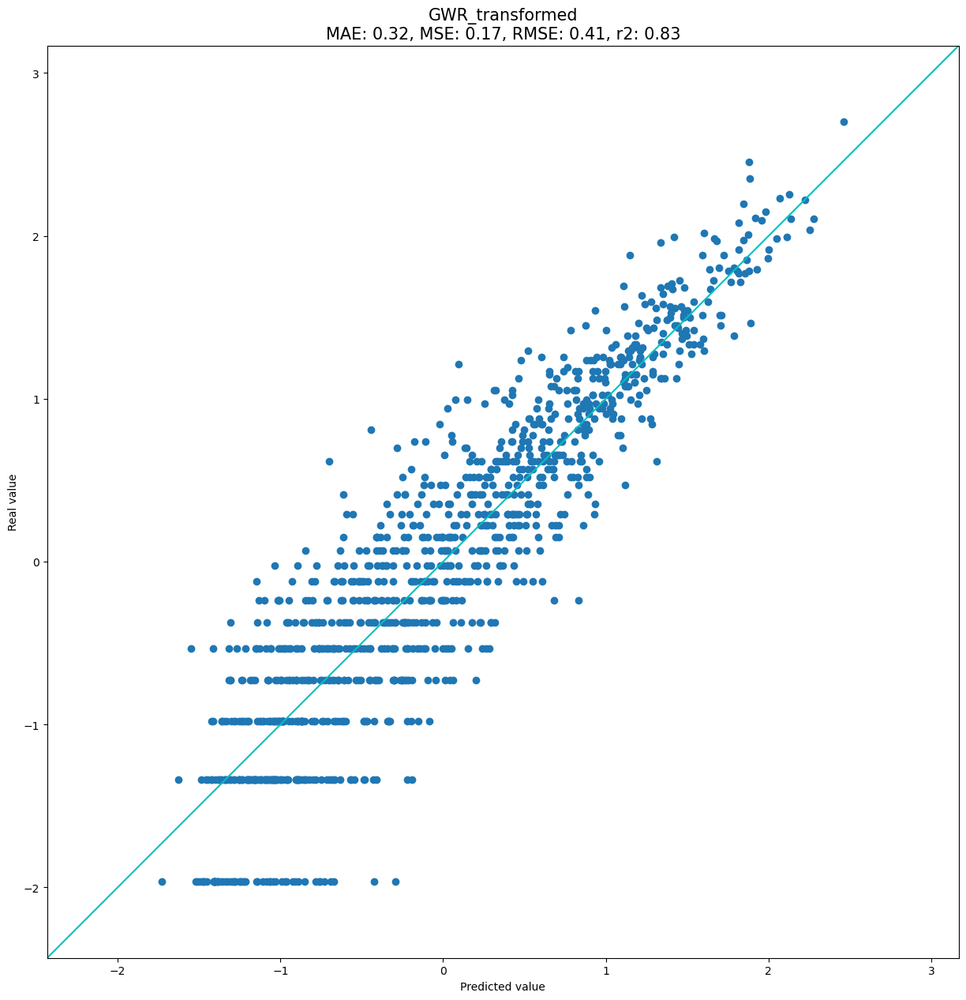

In [80]:
pa_gwr_tf.plot_scatter(save_fig=SAVE_FIGS, root_name=DIR_GWR / "gwr_transformed")

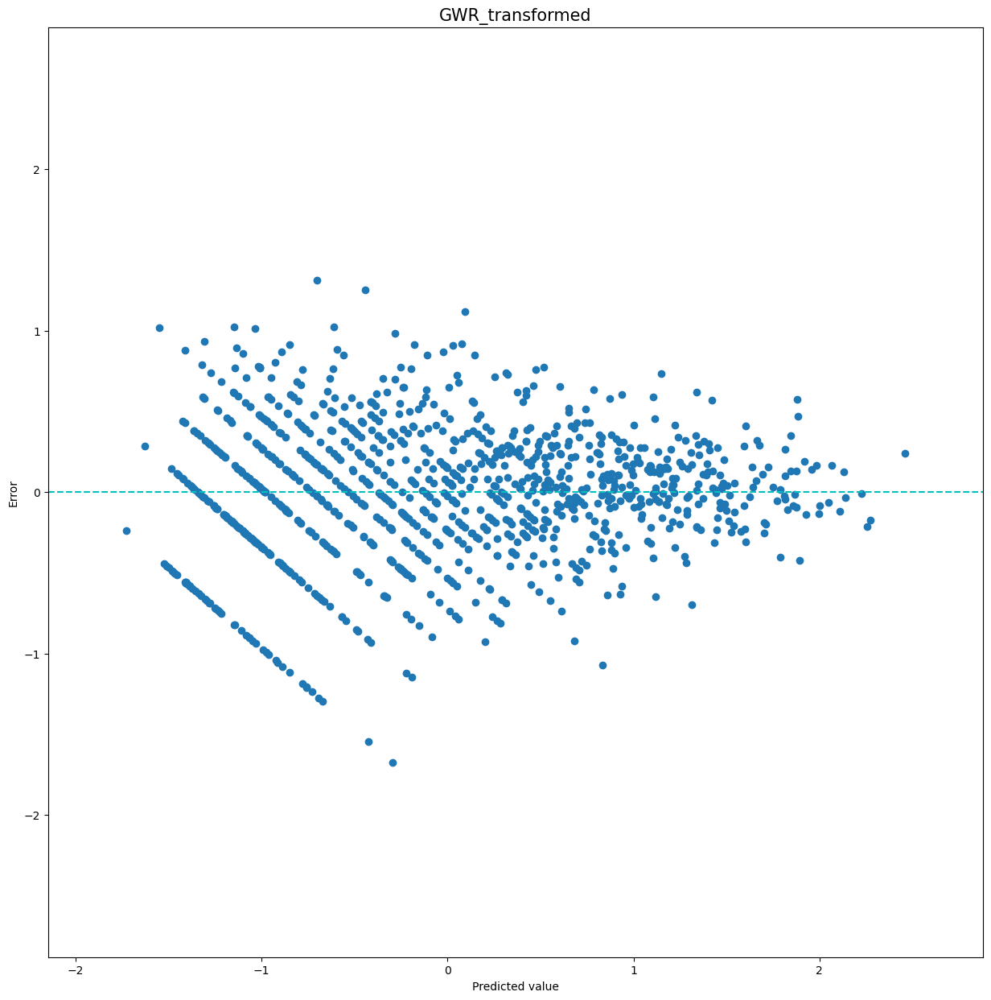

In [81]:
pa_gwr_tf.plot_errors(save_fig=SAVE_FIGS, root_name=DIR_GWR / "gwr_transformed")

# Visualization of results

## Local $R^2$ ($R^2$ of each regression)

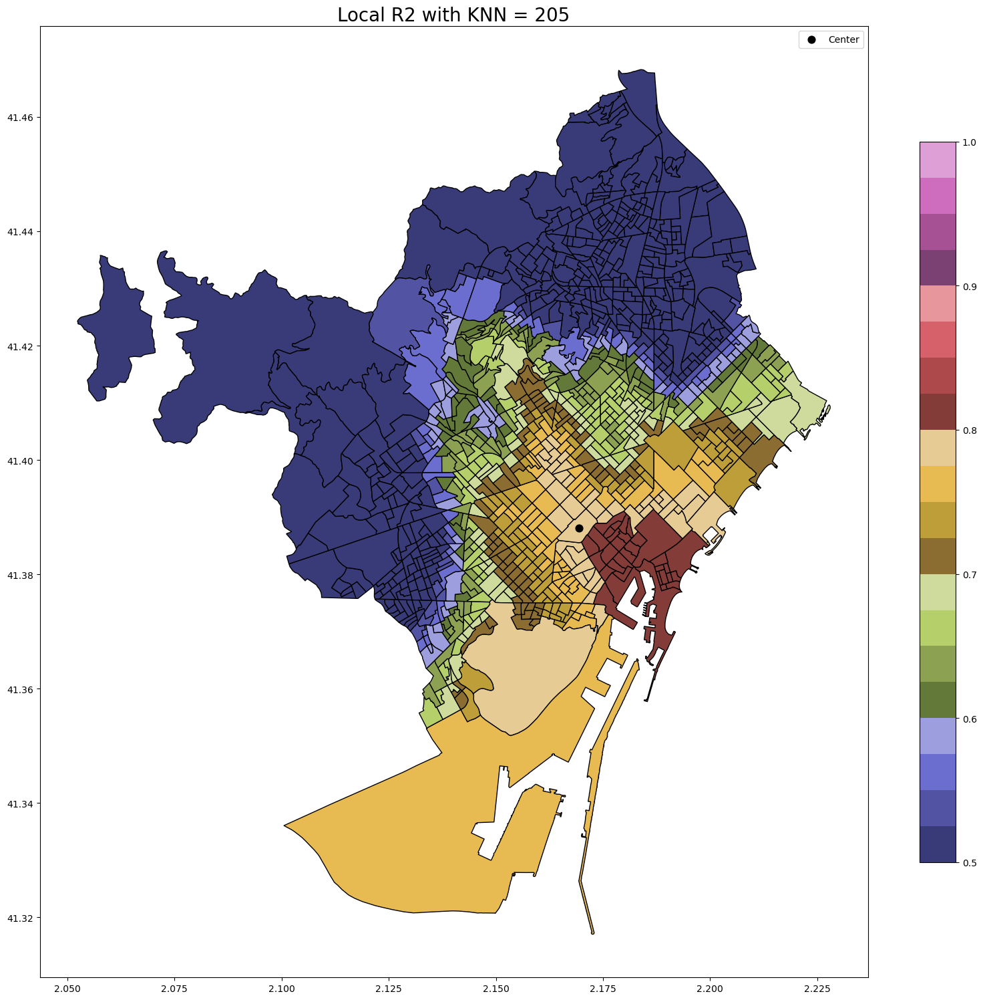

In [82]:
geo_info["Chosen_Local_R2"] = gwr_results.localR2

fig, ax = plt.subplots(figsize=(20, 20))
geo_info.plot(
    ax=ax,
    edgecolor="black",
    column="Chosen_Local_R2",
    legend=True,
    vmin=0.5,
    vmax=1,
    cmap="tab20b",
    legend_kwds={"shrink": 0.7},
)
geo_info[geo_info.index == id_max_airbnb].centroid.plot(
    ax=ax, color="black", markersize=60, label="Center"
)

plt.legend()

ax.set_title(
    "Local R2 with KNN = {}".format(int(gwr_bw)),
    fontsize=20,
)

if SAVE_FIGS:
    plt.savefig(DIR_GWR / "local_r2.svg", format="svg")

plt.show()

## Relative errors

In [83]:
geo_info["Chosen_Error"] = (
    2
    * (y_truth.values - y_predicted.values)
    / (abs(y_truth.values) + abs(y_predicted.values))
)

col_lim = max(abs(geo_info["Chosen_Error"].min()), abs(geo_info["Chosen_Error"].max()))

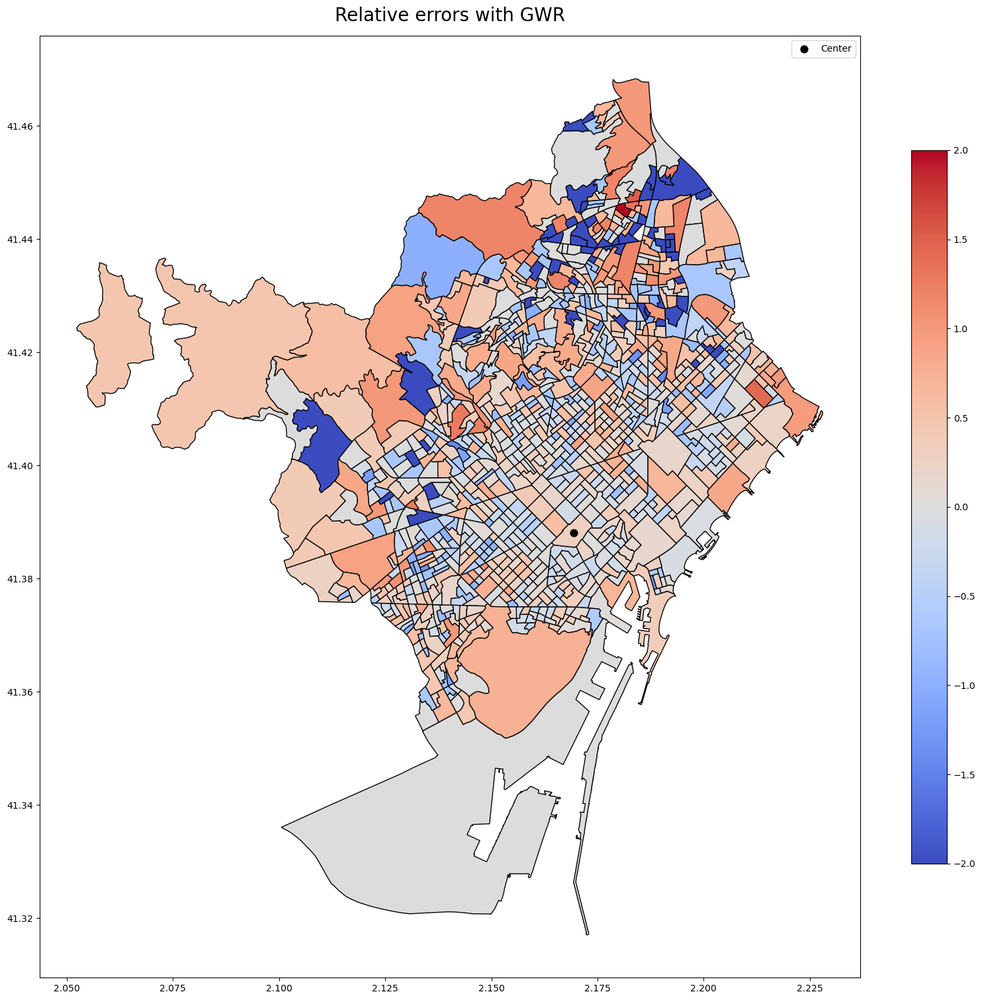

In [84]:
fig, ax = plt.subplots(figsize=(20, 20))
geo_info.plot(
    ax=ax,
    edgecolor="black",
    column="Chosen_Error",
    legend=True,
    vmin=-col_lim,
    vmax=col_lim,
    cmap="coolwarm",
    legend_kwds={"shrink": 0.7},
)

geo_info[geo_info.index == id_max_airbnb].centroid.plot(
    ax=ax, color="black", markersize=60, label="Center"
)

plt.legend()

ax.set_title("Relative errors with GWR", fontsize=20, y=1.01)

if SAVE_FIGS:
    plt.savefig(DIR_GWR / "relative_errors.svg", format="svg")

plt.show()

## Areas of importance of each feature

In [85]:
gwr_columns = best_model.copy()
if FIT_INTERCEPT:
    gwr_columns = gwr_columns.insert(0, "Intercept")
coefs_gwr = pd.DataFrame(gwr_results.params, columns=gwr_columns)

medians_gwr = coefs_gwr.median()
medians_gwr = medians_gwr.reindex(medians_gwr.abs().sort_values(ascending=False).index)
coefs_gwr = coefs_gwr[medians_gwr.index]

limit_value = (
    max(abs(coefs_gwr.to_numpy().min()), abs(coefs_gwr.to_numpy().max())) * 1.05
)

In [86]:
# Copy coefficients in geodatagrame to plot
for col in coefs_gwr.columns:
    #     if col != "Intercept":
    #     if True:
    geo_coefs[col] = coefs_gwr[col].values

In [87]:
# Get t-vals of coefficientes
gwr_filtered_t = pd.DataFrame(gwr_results.filter_tvals(), columns=gwr_columns)
gwr_filtered_t.index = geo_info.index

# Copy coefficients in new dataframe so non-significant can later be removed
geo_significant_coefs = geo_coefs.copy()

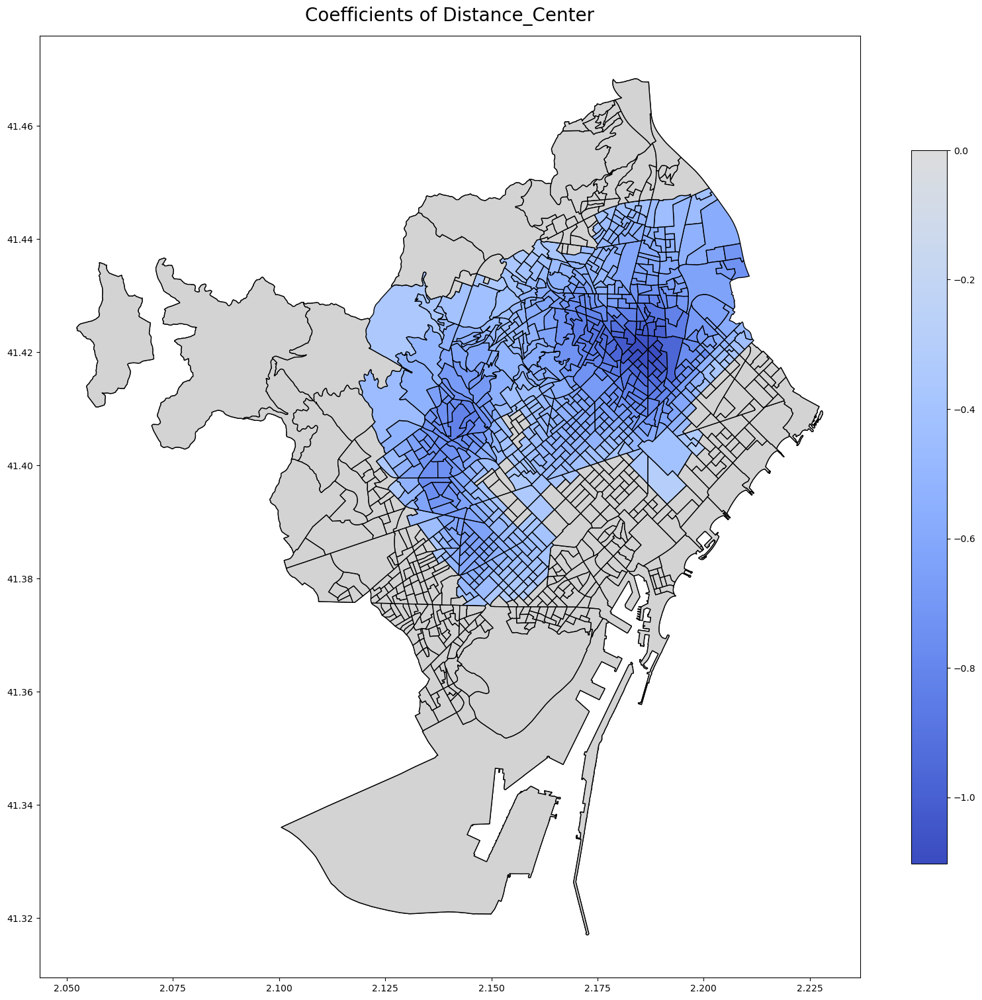

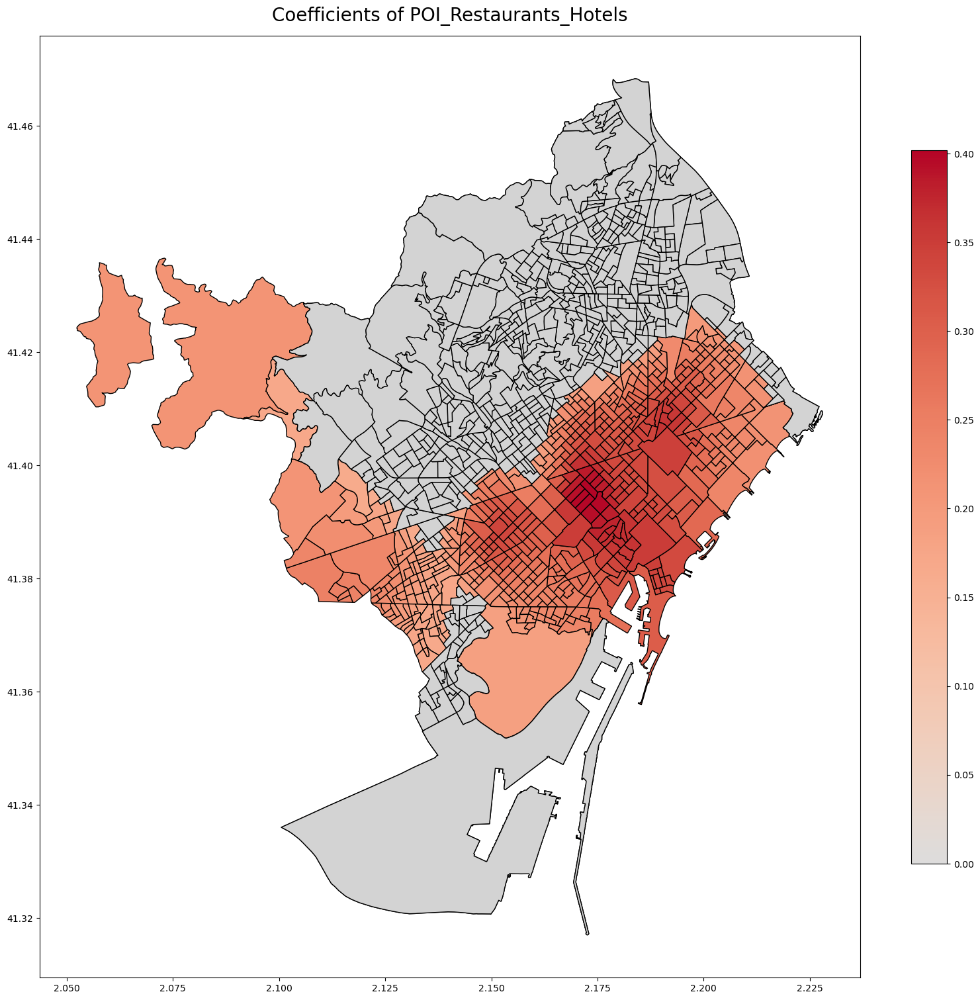

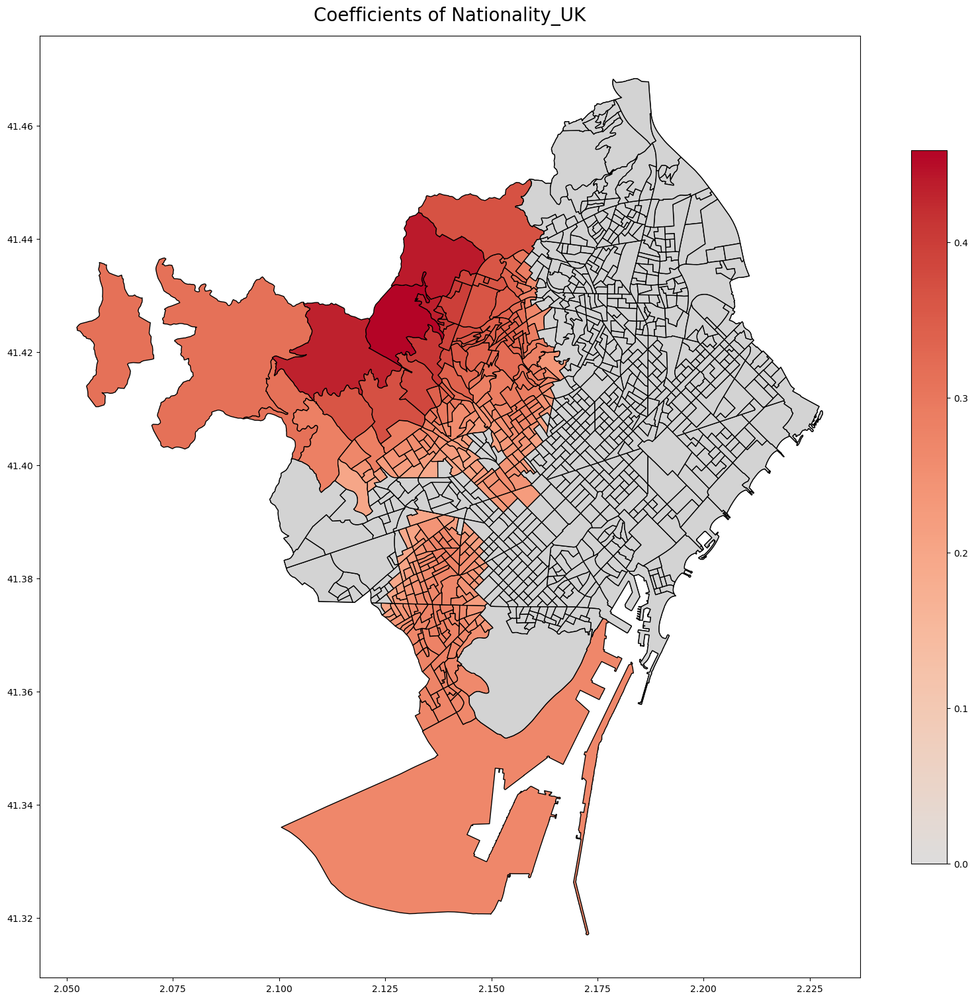

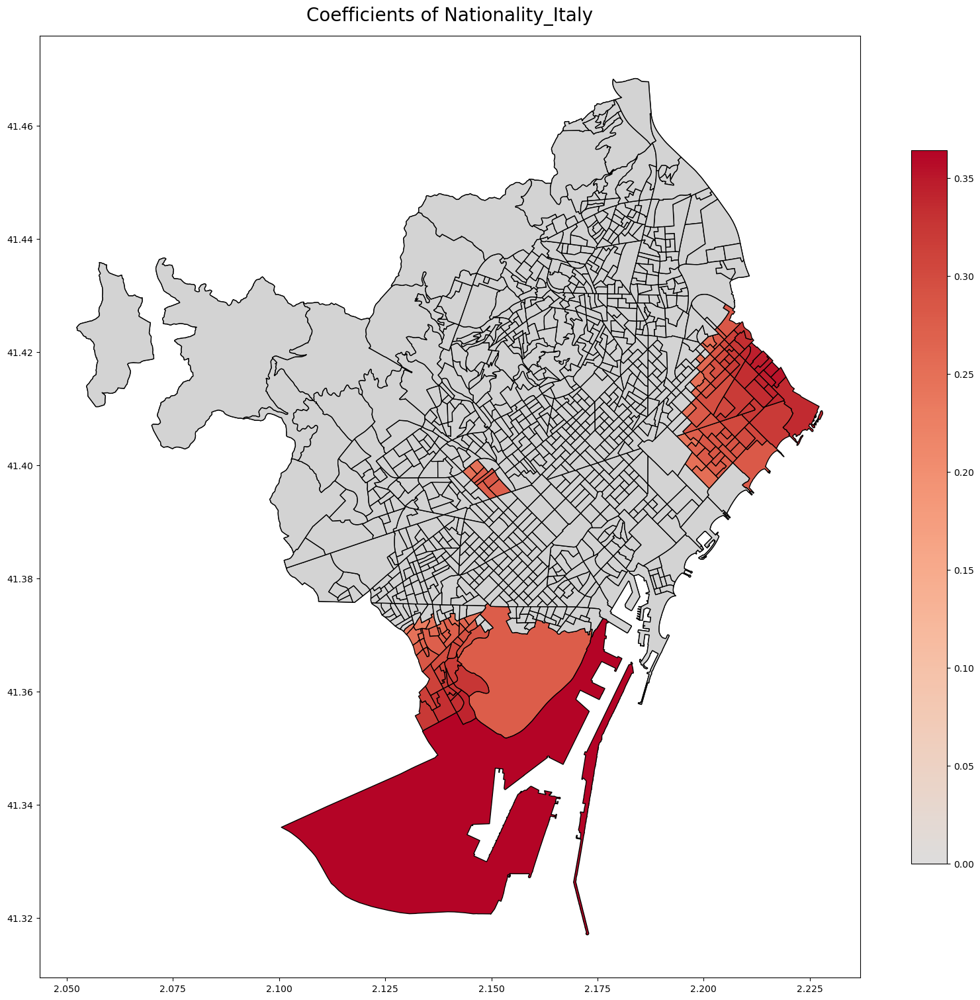

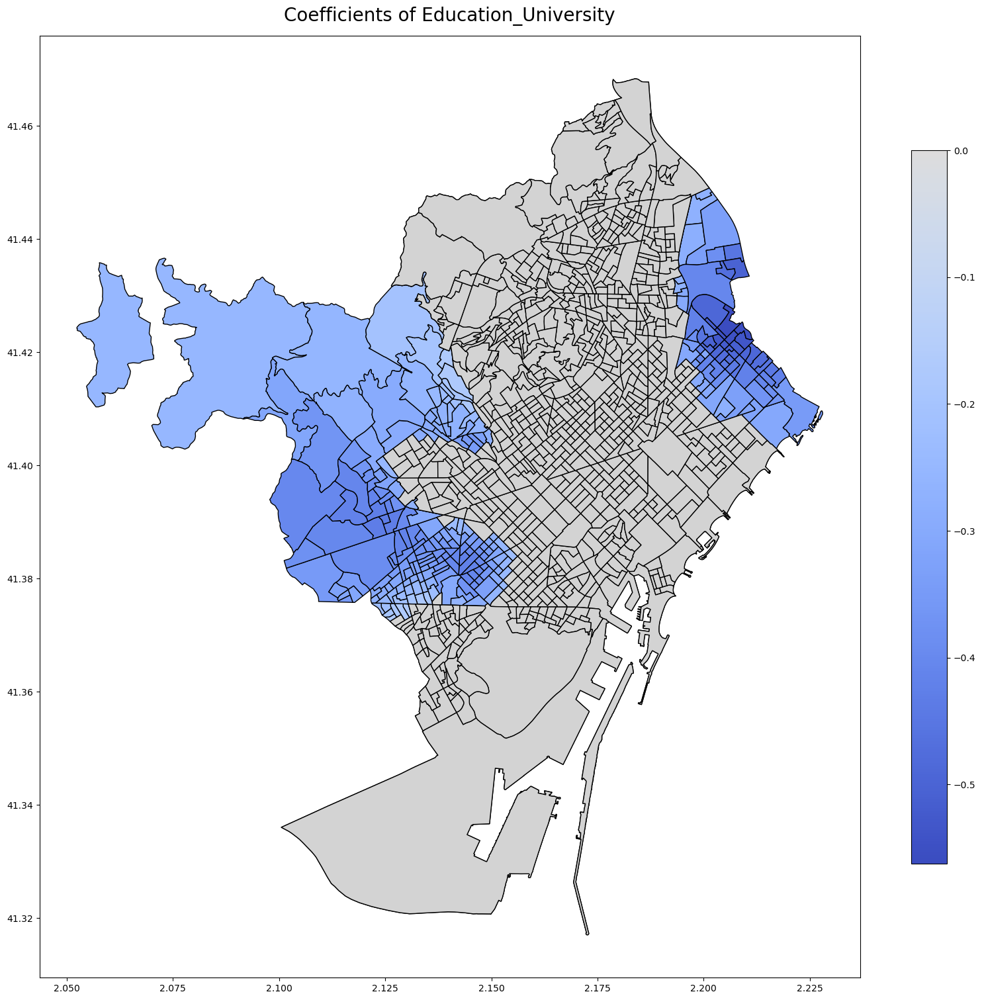

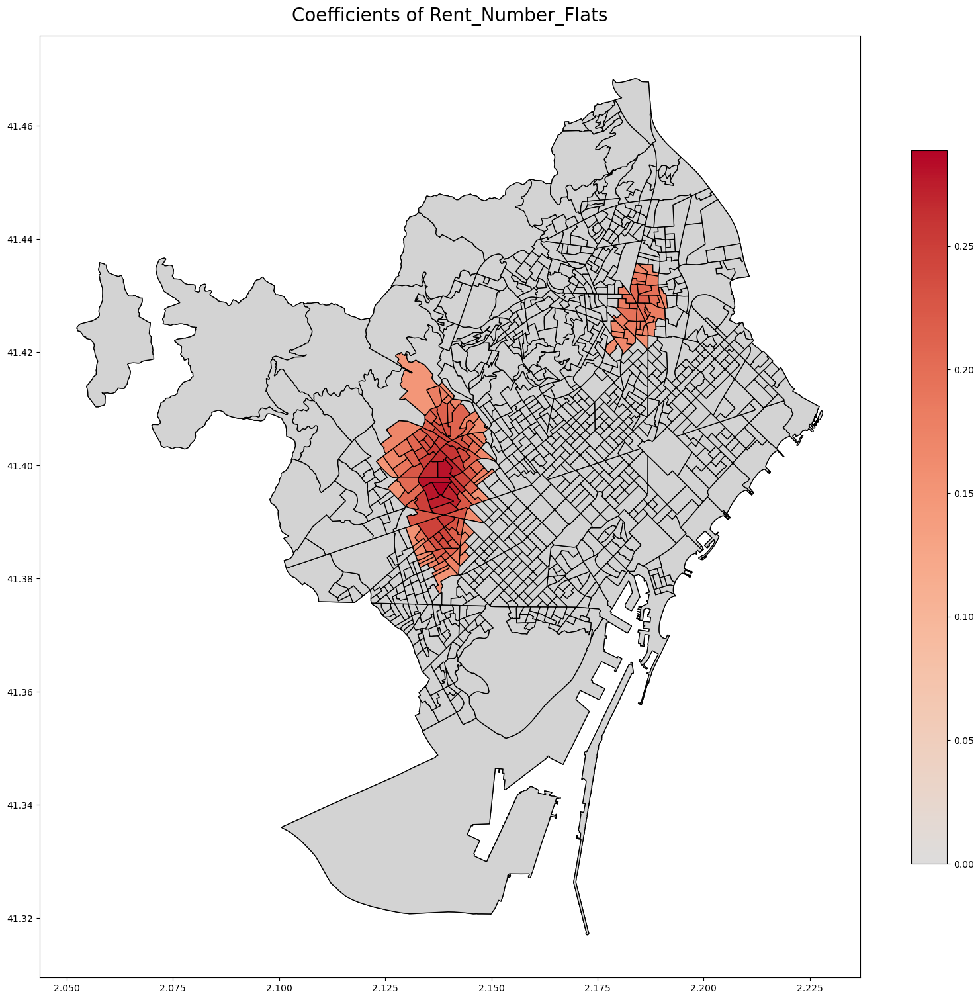

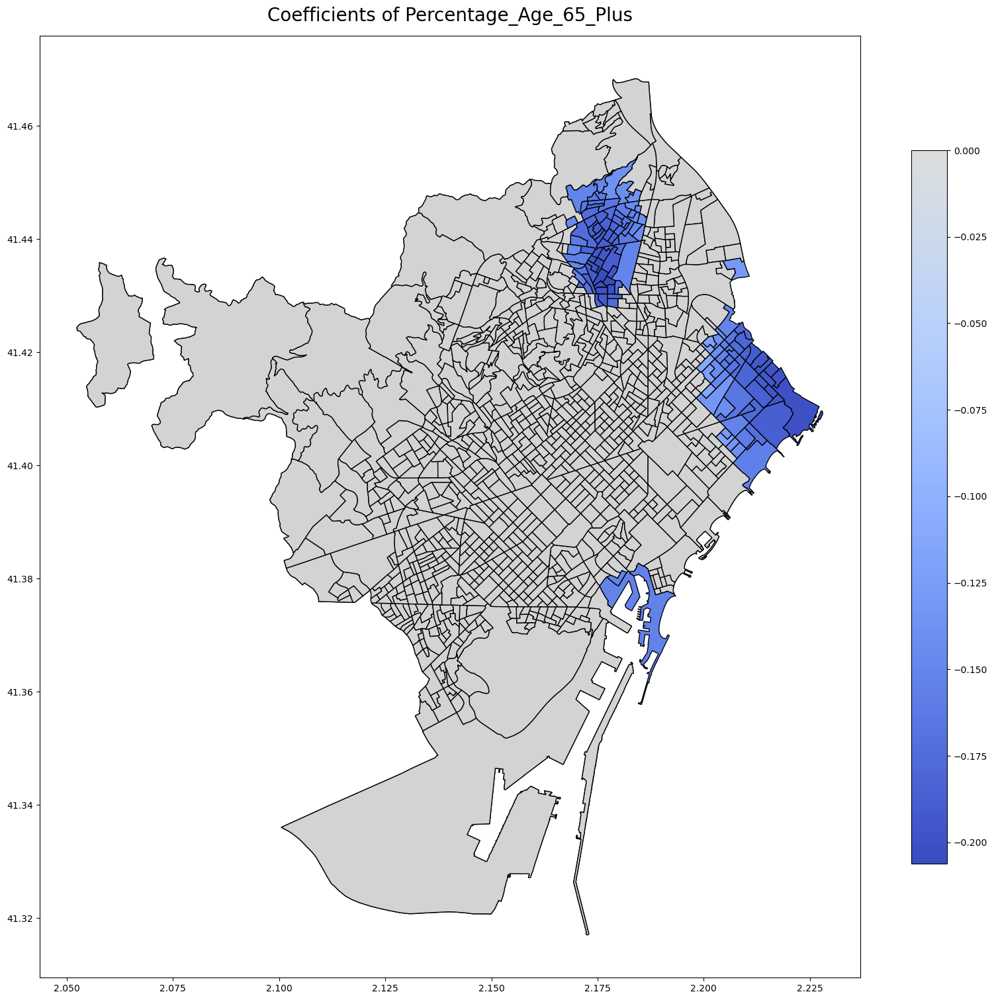

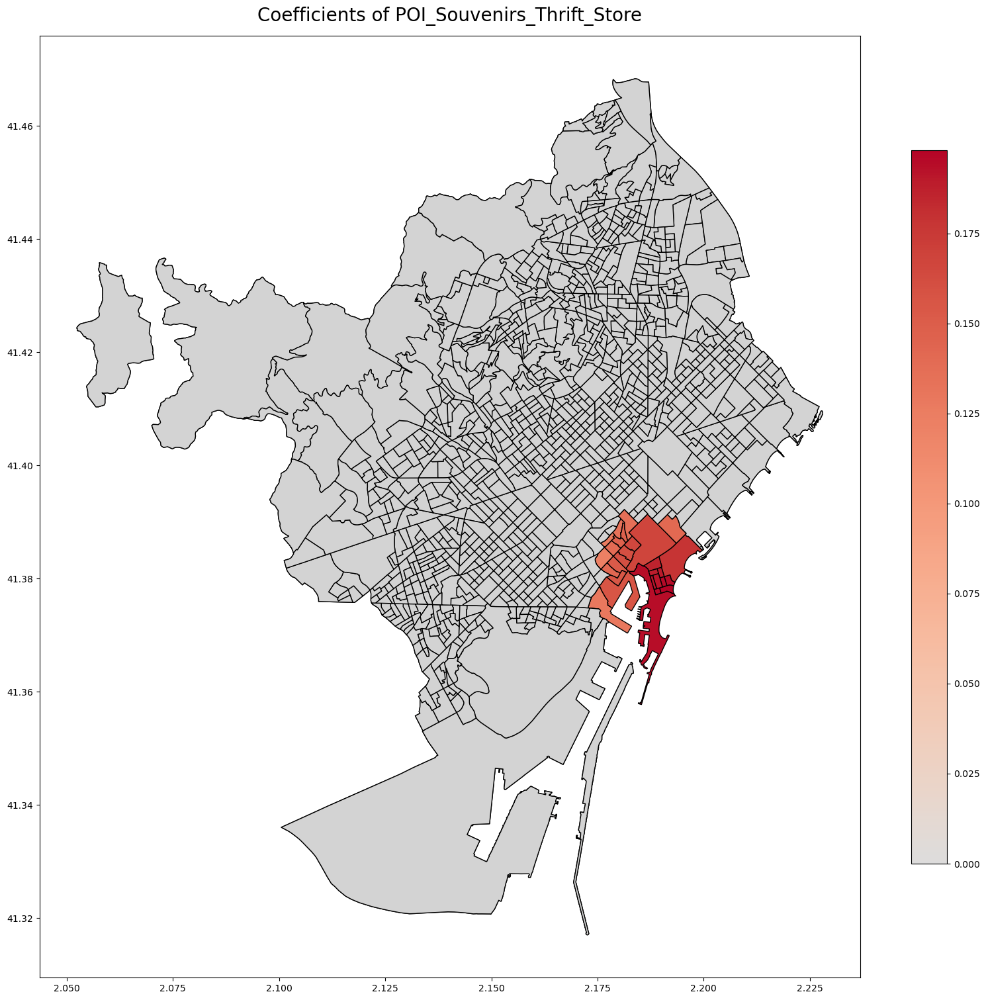

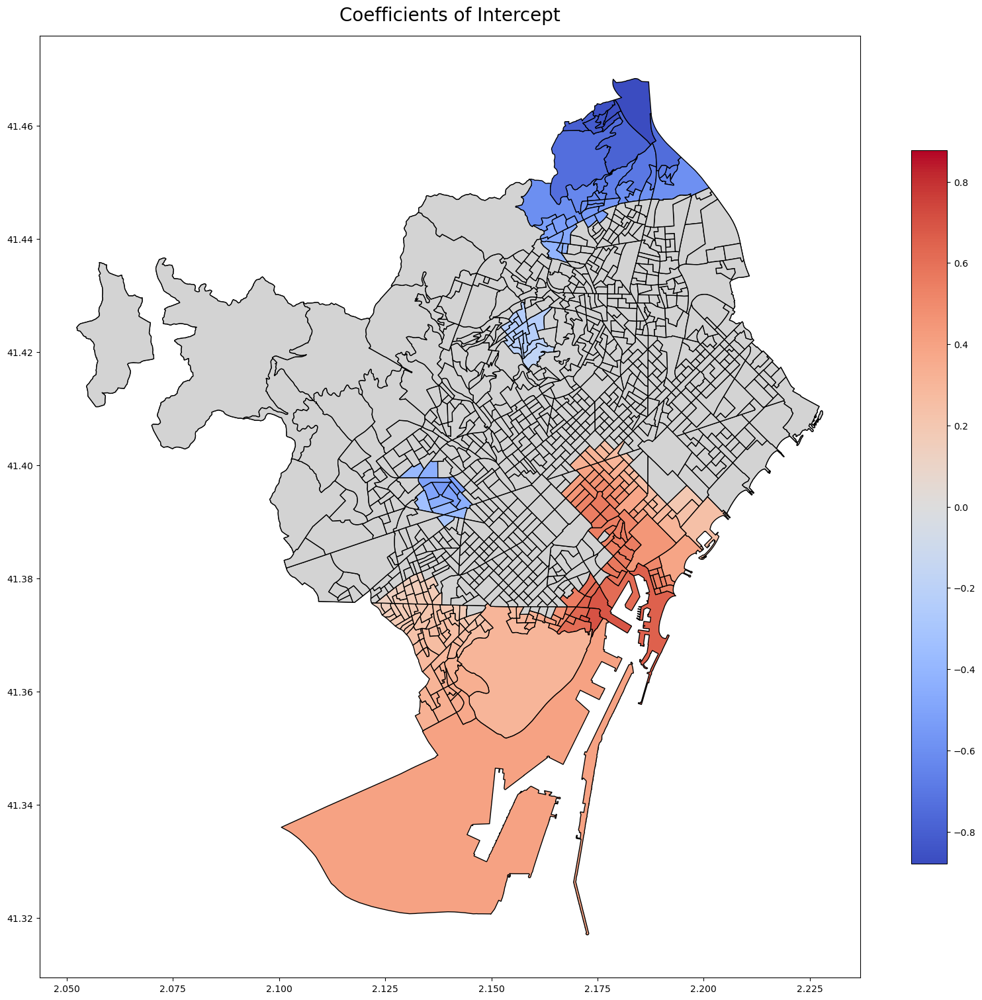

In [88]:
for col in coefs_gwr.columns:
    fig, ax = plt.subplots(figsize=(20, 20))
    min_coef = geo_coefs[gwr_filtered_t.loc[:, col] != 0][col].min()
    max_coef = geo_coefs[gwr_filtered_t.loc[:, col] != 0][col].max()

    cool_warm_cmap = plt.cm.coolwarm

    if min_coef < 0 and max_coef < 0:
        interval = np.linspace(0, 0.5)
        colors = cool_warm_cmap(interval)
        cool_warm_cmap = mpl.colors.LinearSegmentedColormap.from_list("name", colors)
        vmin = min_coef
        vmax = 0
    elif min_coef > 0 and max_coef > 0:
        interval = np.linspace(0.5, 1)
        colors = cool_warm_cmap(interval)
        cool_warm_cmap = mpl.colors.LinearSegmentedColormap.from_list("name", colors)
        vmin = 0
        vmax = max_coef
    else:
        vmax = max(abs(min_coef), abs(max_coef))
        vmin = -vmax

    geo_coefs.plot(
        ax=ax,
        edgecolor="black",
        column=col,
        legend=True,
        vmin=vmin,
        vmax=vmax,
        cmap=cool_warm_cmap,
        legend_kwds={"shrink": 0.7},
    )
    if (gwr_filtered_t.loc[:, col] == 0).any():
        geo_info[gwr_filtered_t.loc[:, col] == 0].plot(
            color="lightgrey", ax=ax, **{"edgecolor": "black"}
        )
        temp = geo_significant_coefs[[col]]
        temp[gwr_filtered_t.loc[:, col] == 0] = np.nan
        geo_significant_coefs[col] = temp[col]

    ax.set_title("Coefficients of {}".format(col), fontsize=20, y=1.01)

    if SAVE_FIGS:
        plt.savefig(
            DIR_GWR / "coefficients/{}.svg".format(col),
            format="svg",
        )

    plt.show()

## Statistics about each feature and section

In [89]:
significant_coefs_gwr = geo_significant_coefs.drop(["geometry"], axis=1)

limit_value = (
    max(
        np.nanmin(abs(significant_coefs_gwr.to_numpy())),
        np.nanmax(abs(significant_coefs_gwr.to_numpy())),
    )
    * 1.05
)

if FIT_INTERCEPT:
    medians_gwr = significant_coefs_gwr.drop(["Intercept"], axis=1).median()
else:
    medians_gwr = significant_coefs_gwr.median()

medians_gwr = medians_gwr.reindex(medians_gwr.abs().sort_values(ascending=False).index)

if FIT_INTERCEPT:
    medians_gwr = medians_gwr.append(pd.Series({"Intercept": 0}, index=["Intercept"]))

significant_coefs_gwr = significant_coefs_gwr[medians_gwr.index]

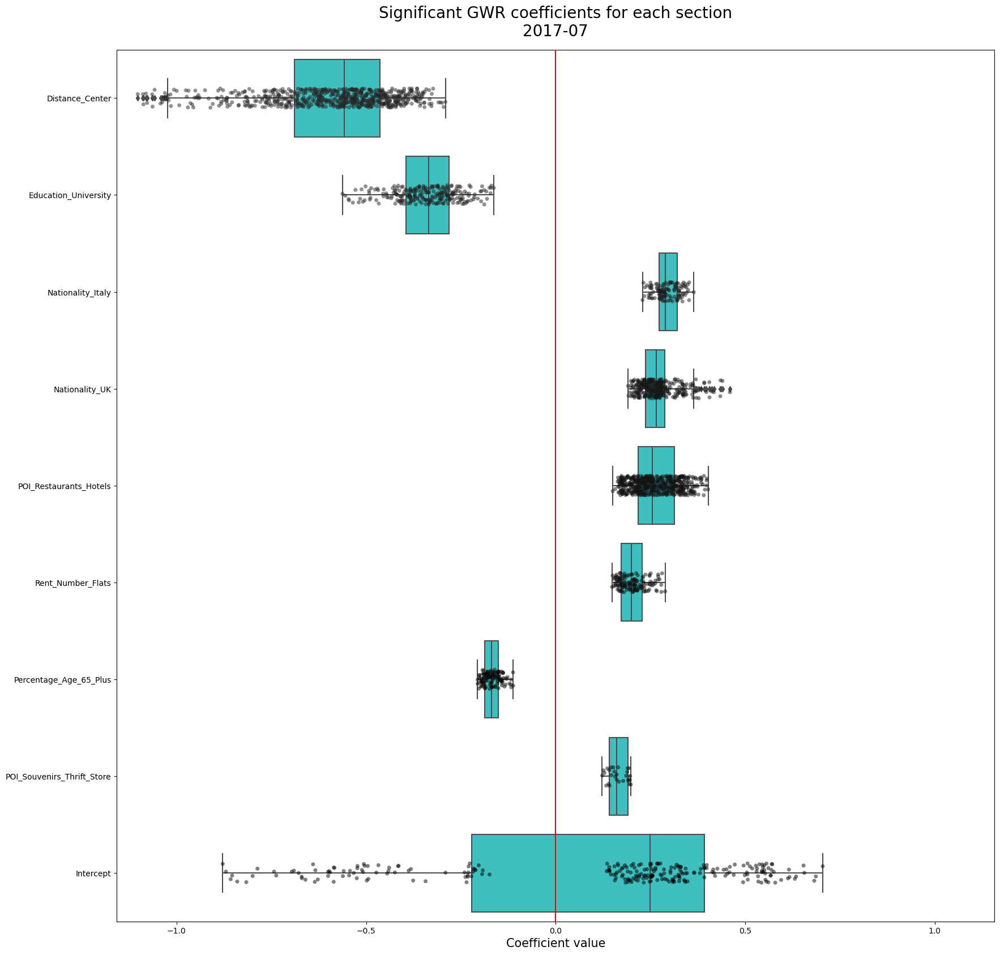

In [90]:
fig, ax = plt.subplots(figsize=(20, 20))

sns.stripplot(
    ax=ax,
    data=significant_coefs_gwr,
    orient="h",
    color="k",
    alpha=0.5,
)
sns.boxplot(
    ax=ax,
    data=significant_coefs_gwr,
    orient="h",
    color="cyan",
    saturation=0.5,
)
plt.axvline(x=0, color="red")

ax.set_title(
    "Significant GWR coefficients for each section\n{}-{:02d}".format(YEAR, MONTH),
    fontsize=20,
    y=1.01,
)
ax.set_xlim(-limit_value, limit_value)
ax.set_xlabel("Coefficient value", fontsize=15)

if SAVE_FIGS:
    plt.savefig(DIR_GWR / "gwr_significant_coefficients.svg", format="svg")

plt.show()

In [91]:
significant_count = pd.DataFrame(
    [significant_coefs_gwr.count().index, significant_coefs_gwr.count().values]
).T
significant_count.columns = ["Features", "Percentage"]
significant_count["Percentage"] = significant_count["Percentage"] / X.shape[0]

significant_count.sort_values(by=["Percentage"], ascending=False, inplace=True)

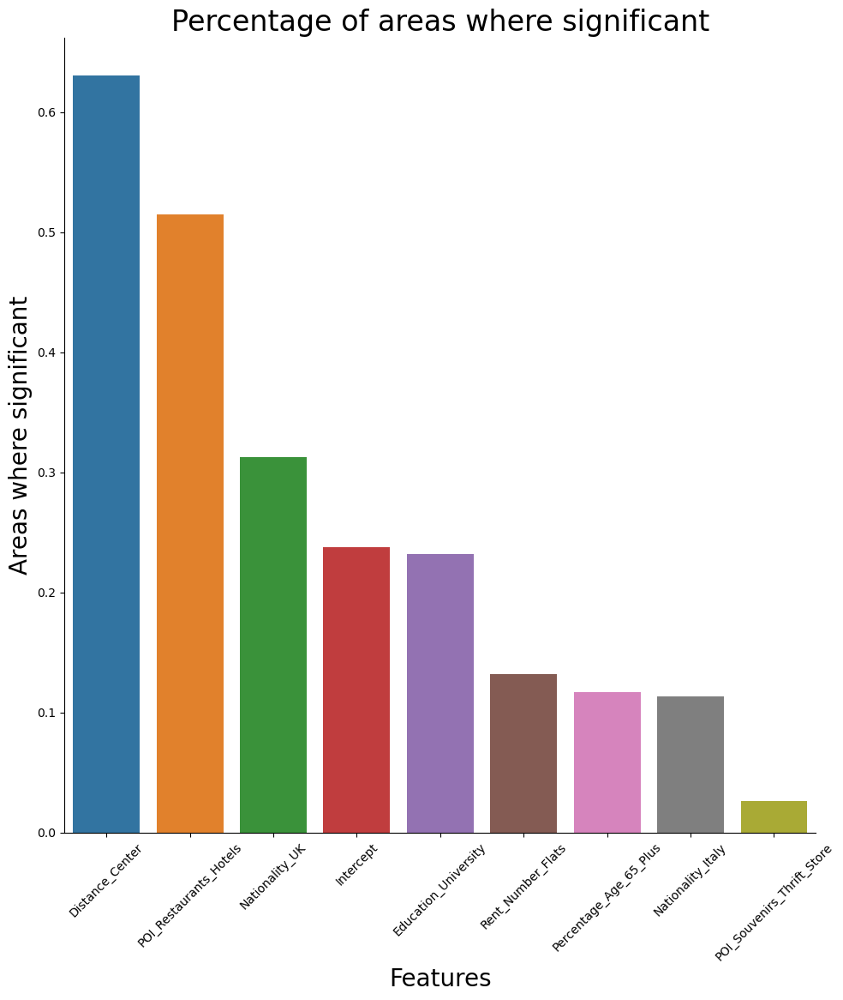

In [92]:
g = sns.catplot(
    ax=ax,
    x="Features",
    y="Percentage",
    kind="bar",
    data=significant_count,
    height=10,
    aspect=1,
)

# g.set_title("Significancy of features", fontsize=50)
plt.xlabel("Features", fontsize=20)
plt.ylabel("Areas where significant", fontsize=20)
plt.xticks(rotation=45)
plt.title("Percentage of areas where significant", size=24)

if SAVE_FIGS:
    g.savefig(DIR_GWR / "significant_counts.svg", format="svg")

plt.show()

In [93]:
area_count = pd.DataFrame(
    [significant_coefs_gwr.index, significant_coefs_gwr.T.count().values]
).T
area_count.columns = ["Area", "Count"]
area_count.set_index("Area", inplace=True)
geo_info["Area_Count"] = area_count["Count"]

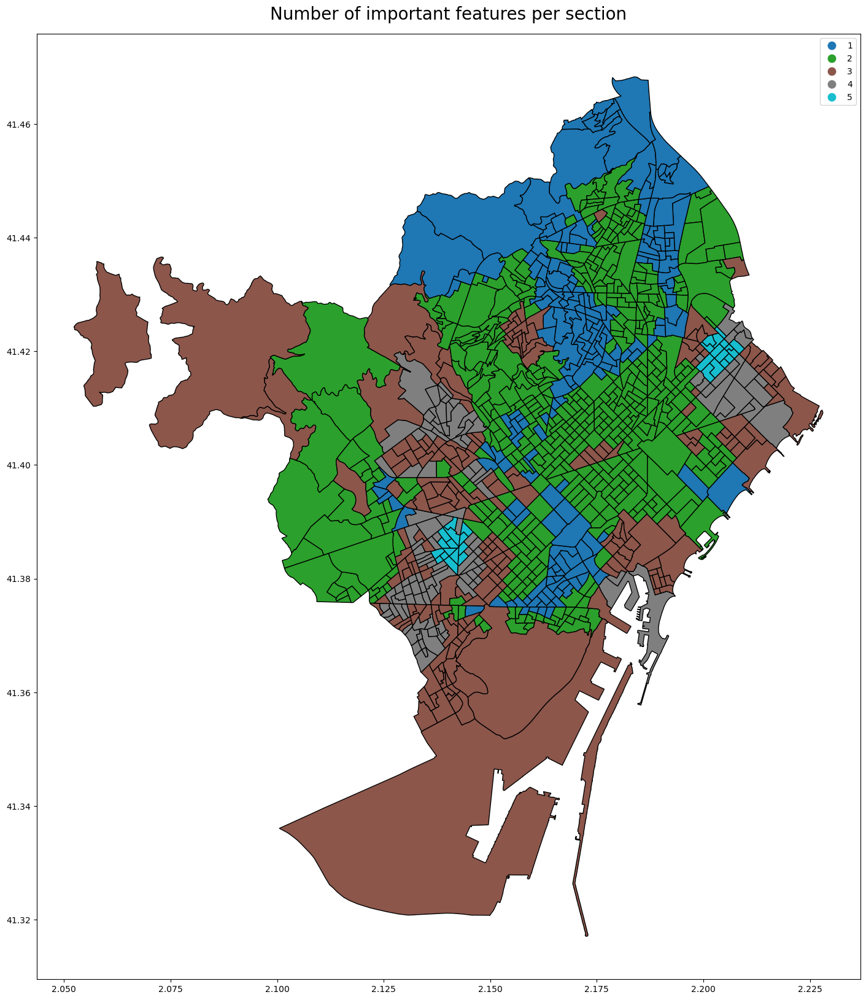

In [94]:
fig, ax = plt.subplots(figsize=(20, 20))
geo_info.plot(
    ax=ax,
    edgecolor="black",
    column="Area_Count",
    legend=True,
    #     vmin=0.5,
    #     vmax=1,
    cmap="tab10",
    #     legend_kwds={"shrink": 0.7},
)

ax.set_title("Number of important features per section", fontsize=20, y=1.01)

# geo_info[geo_info[VARIABLE_TO_PREDICT] == 0].centroid.plot(ax=ax, color="red")

if SAVE_FIGS:
    plt.savefig(DIR_GWR / "number_features.svg", format="svg")

plt.show()

In [95]:
geo_info["Chosen_Most_Important"] = (
    significant_coefs_gwr.fillna(0).abs().idxmax(axis=1).values
)

temp = geo_info["Chosen_Most_Important"]
temp[significant_coefs_gwr.fillna(0).abs().max(axis=1) == 0] = "!NONE"
geo_info["Chosen_Most_Important"] = temp

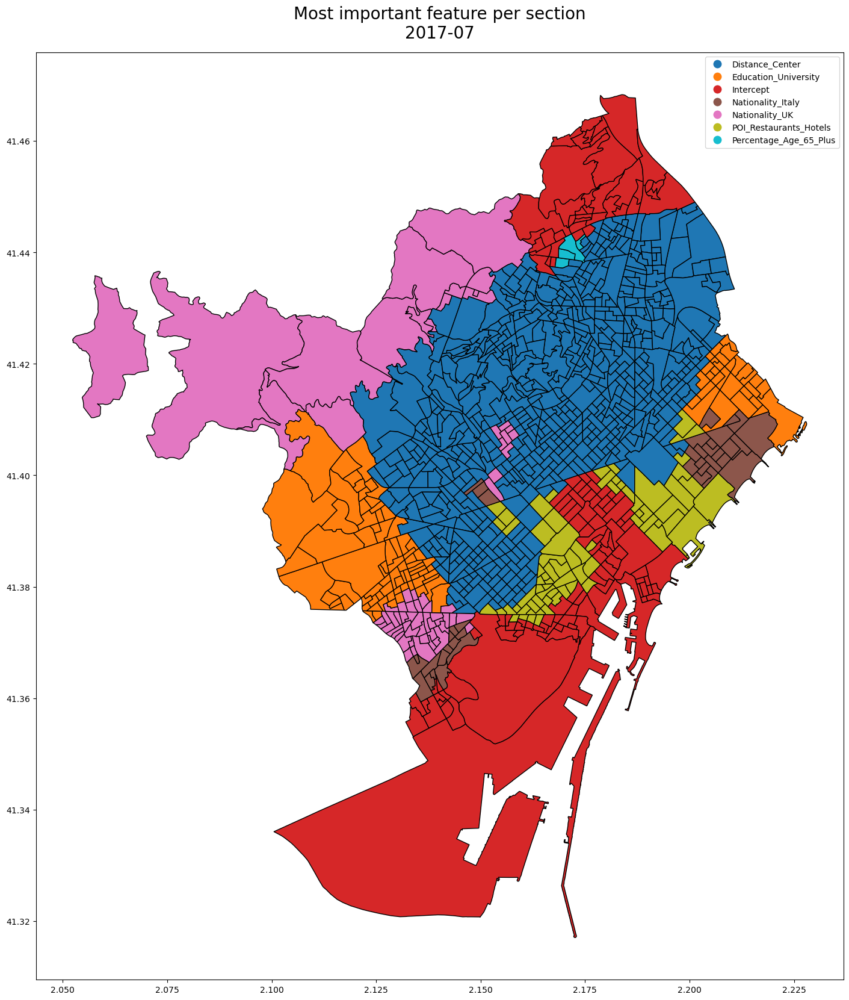

In [96]:
fig, ax = plt.subplots(figsize=(20, 20))
geo_info.plot(
    ax=ax,
    edgecolor="black",
    column="Chosen_Most_Important",
    legend=True,
)

ax.set_title(
    "Most important feature per section\n{}-{:02d}".format(YEAR, MONTH),
    fontsize=20,
    y=1.01,
)

if SAVE_FIGS:
    plt.savefig(DIR_GWR / "important_features.svg", format="svg")


plt.show()

# Model comparison: linear vs GWR

In [97]:
comparison = []
comparison_names = []
for col in significant_coefs_gwr.columns:
    comparison.append(significant_coefs_gwr[col].dropna().values)
    comparison.append(linear_coefs[col].values)
    comparison_names.append("GWR - {}".format(col))
    comparison_names.append("Linear - {}".format(col))


df_comparison = pd.DataFrame(comparison).T
df_comparison.columns = [col for col in comparison_names]

limit_value = (
    max(
        np.nanmin(abs(df_comparison.to_numpy())),
        np.nanmax(abs(df_comparison.to_numpy())),
    )
    * 1.05
)

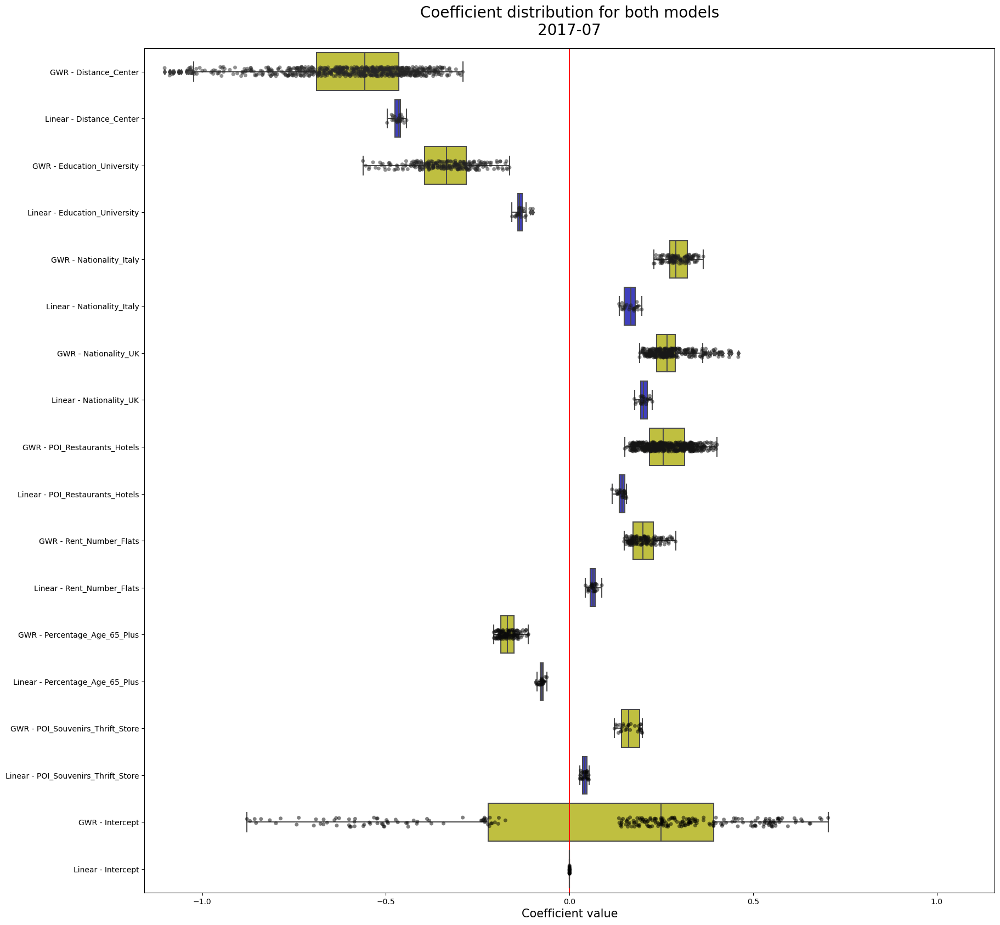

In [98]:
fig, ax = plt.subplots(figsize=(20, 20))

sns.stripplot(
    ax=ax,
    data=df_comparison,
    orient="h",
    color="k",
    alpha=0.5,
)

pal = {
    col: "yellow" if col.startswith("GWR") else "blue" for col in df_comparison.columns
}

sns.boxplot(
    ax=ax,
    data=df_comparison,
    orient="h",
    palette=pal,
    saturation=0.5,
)

plt.axvline(x=0, color="red")

ax.set_title(
    "Coefficient distribution for both models\n{}-{:02d}".format(YEAR, MONTH),
    fontsize=20,
    y=1.01,
)
ax.set_xlim(-limit_value, limit_value)
ax.set_xlabel("Coefficient value", fontsize=15)

if SAVE_FIGS:
    plt.savefig(DIR_GWR / "model_comparison.svg", format="svg")
#     plt.savefig(DIR_GWR / "model_comparison.jpg")


plt.show()